# Import para la maquina con Google Drive




In [ ]:
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

import tensorflow as tf

print(os.getcwd())
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

/content
Num GPUs Available:  1
Mounted at /content/drive


# Cargar y preprocesar datos


In [ ]:
# OPCION 1: Subir archivos al google drive, preferentemente subir la totalidad
# la carpeta a la caprte del drive raiz. Si no, modificar a la dirección escrita

from google.colab import drive
drive.mount('/content/drive')

option = 1

if option == 1:
  # OPCION 1: Subir archivos al google drive, preferentemente subir la totalidad
  # la carpeta a la caprte del drive raiz. Si no, modificar a la dirección escrita
  train_imgs = np.load('./drive/MyDrive/MIOCARDIO/train_imgs.npy')
  train_annot = np.load('./drive/MyDrive/MIOCARDIO/train_annot.npy')
  test_imgs = np.load('./drive/MyDrive/MIOCARDIO/test_imgs.npy')
  test_annot = np.load('./drive/MyDrive/MIOCARDIO/test_annot.npy')
  val_imgs = np.load('./drive/MyDrive/MIOCARDIO/val_imgs.npy')
  val_annot = np.load('./drive/MyDrive/MIOCARDIO/val_annot.npy')

else:
  # OPCION 2: Subir archivos al google colab, preferentemente subir la totalidad
  # la carpeta a la caprte del drive raiz. Si no, modificar a la dirección escrita
  train_imgs = np.load('./MIOCARDIO/train_imgs.npy')
  train_annot = np.load('./MIOCARDIO/train_annot.npy')
  test_imgs = np.load('./MIOCARDIO/test_imgs.npy')
  test_annot = np.load('./MIOCARDIO/test_annot.npy')
  val_imgs = np.load('./MIOCARDIO/val_imgs.npy')
  val_annot = np.load('./MIOCARDIO/val_annot.npy')

In [ ]:
# Cambia el tipo de las imagenes a float
train_imgs = train_imgs.astype('float32')
train_annot = train_annot.astype('float32')
test_imgs = test_imgs.astype('float32')
test_annot = test_annot.astype('float32')
val_imgs = val_imgs.astype('float32')
val_annot = val_annot.astype('float32')

# Cambiamos los pixeles asociado a la clase 2 a que sean de clase 0
train_annot = np.where(train_annot[:][:][:]==2, 0, train_annot)
test_annot = np.where(test_annot[:][:][:]==2, 0, test_annot)
val_annot = np.where(val_annot[:][:][:]==2, 0, val_annot)

train_imgs = train_imgs / 255
test_imgs = test_imgs / 255
val_imgs = val_imgs / 255

train_imgs = tf.constant(np.expand_dims(train_imgs, axis=3))
train_annot = tf.constant(np.expand_dims(train_annot, axis=3))
test_imgs = tf.constant( np.expand_dims(test_imgs, axis=3))
test_annot = tf.constant(np.expand_dims(test_annot, axis=3))
val_imgs = tf.constant(np.expand_dims(val_imgs, axis=3))
val_annot = tf.constant(np.expand_dims(val_annot, axis=3))

print(train_imgs.shape)
print(val_imgs.shape)
print(test_imgs.shape)

# Plots para mostrar los datos y el sector esperado


In [ ]:
def display(display_list):
  '''
  Plotea graficos de la base de datos, mostrando la imagen de input con la 
  imagen que se espera conseguir.

  input : Un listado de matrices de 256x256

  '''
  plt.figure(figsize=(15, 15))
  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
  plt.show()

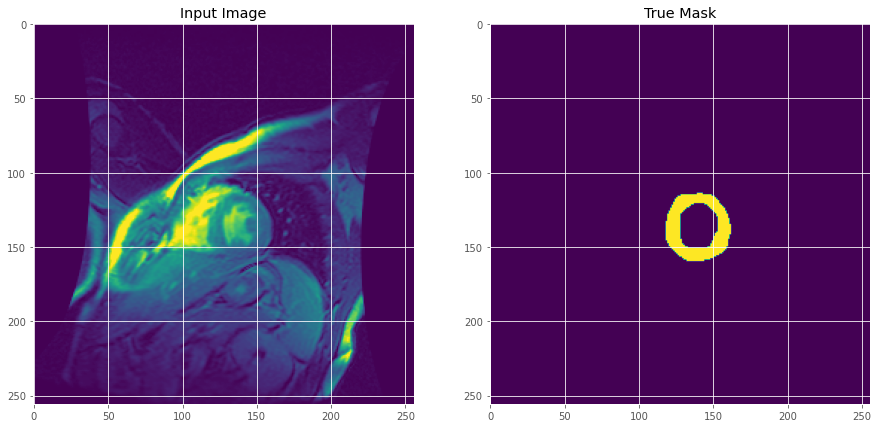

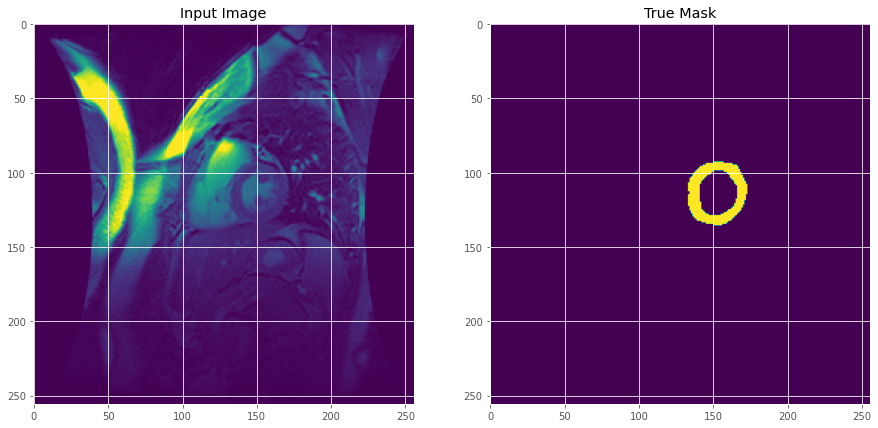

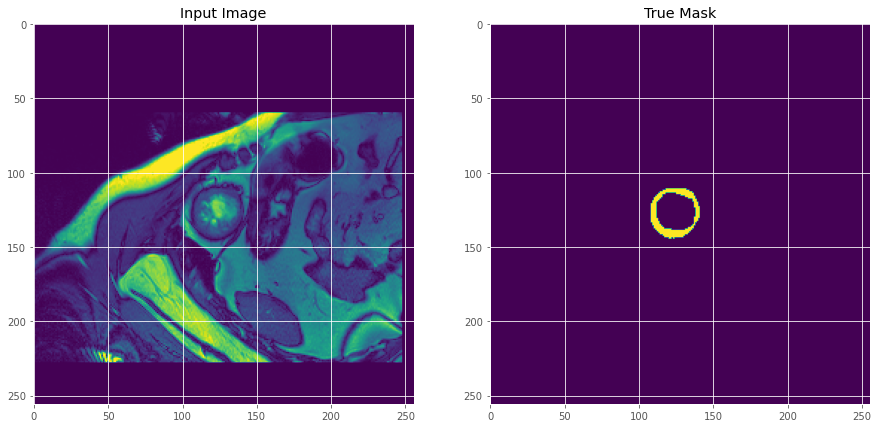

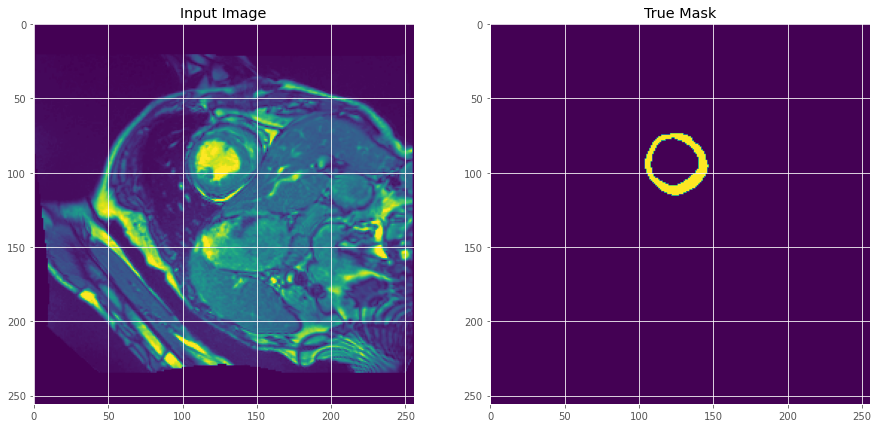

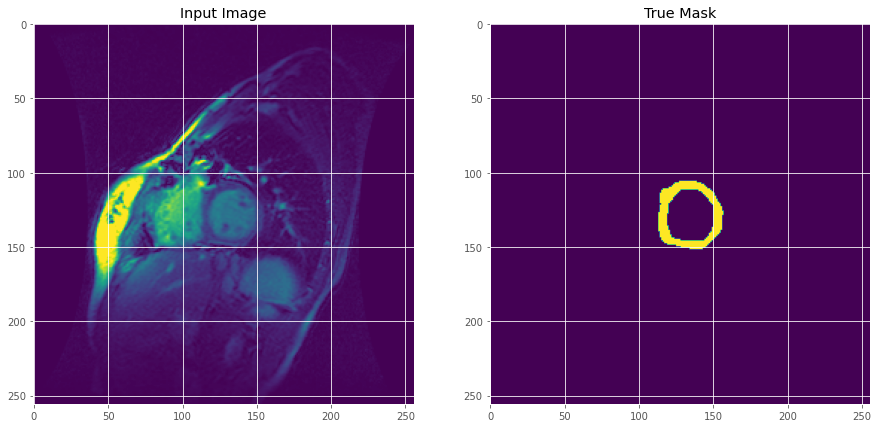

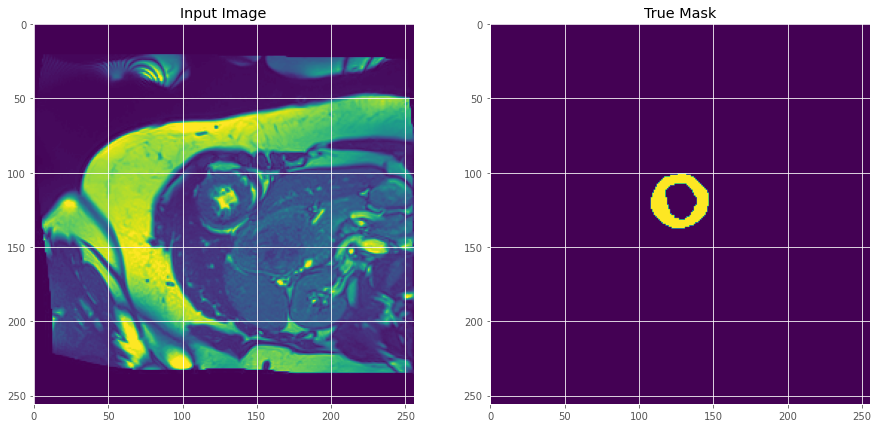

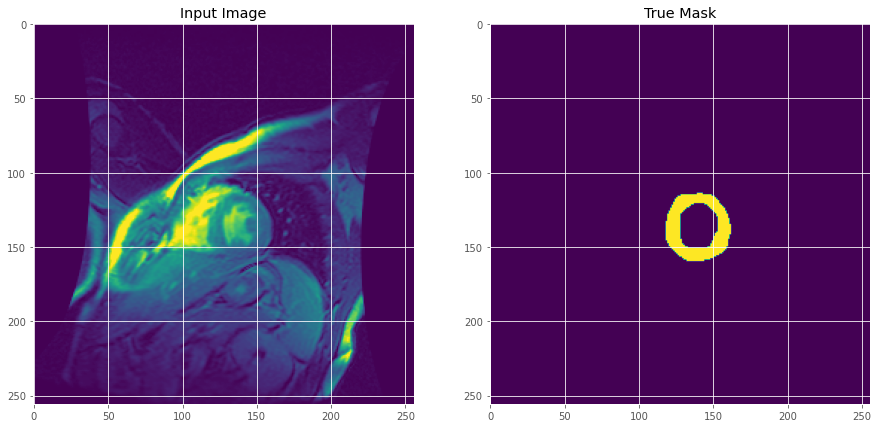

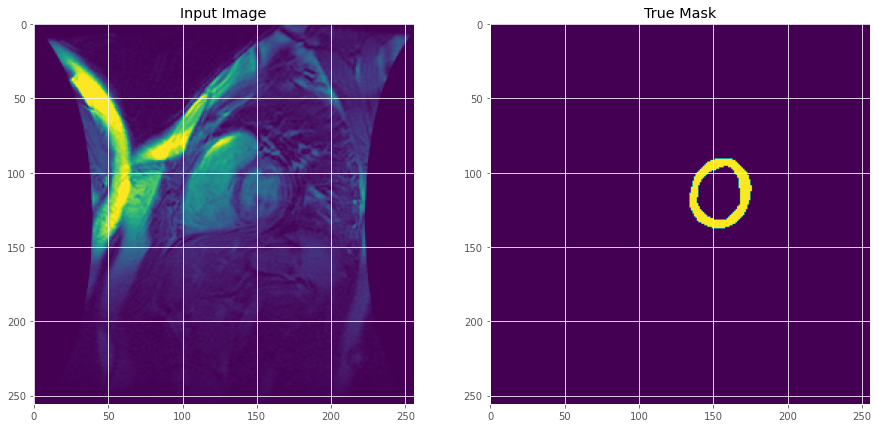

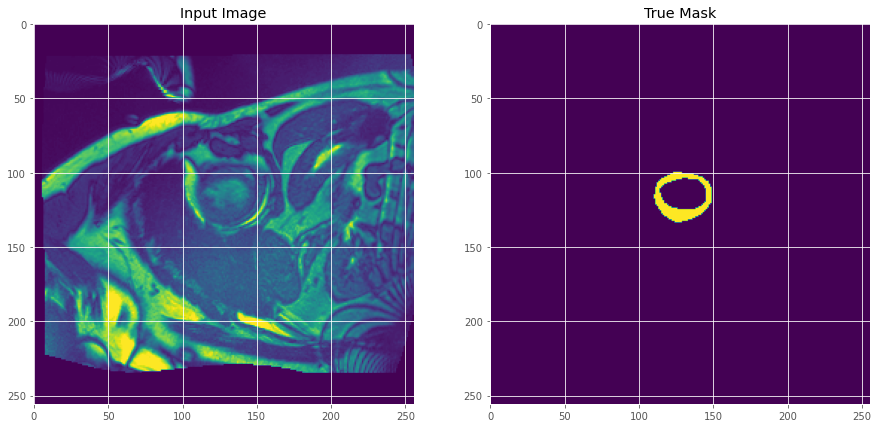

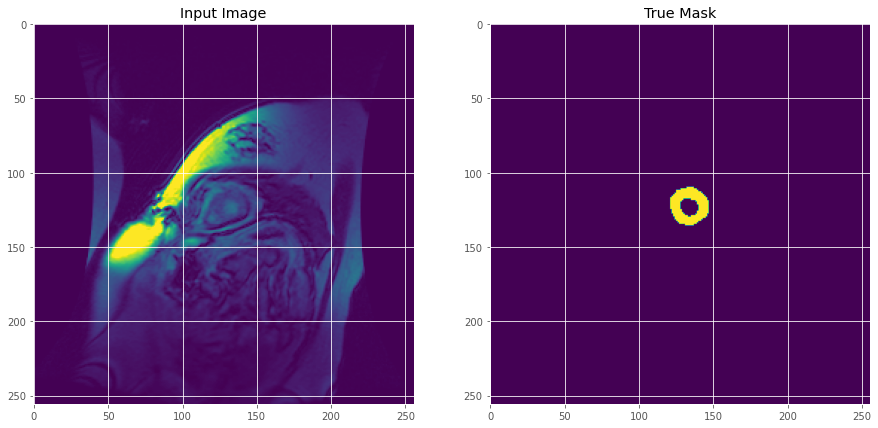

In [ ]:
for i in range(10):
  num = np.random.randint(len(train_imgs)-10)
  display([train_imgs[num], train_annot[num]])

# Creación del modelo


In [ ]:
def conv2d_block(input_tensor, n_filters, kernel_size = 3):
    """Funcion que retorna dos capas convolusionales continuas
      params:
      - input_tensor: capa inicial a unir
      - n_filters: numero de filtros a usar
      - kernerl_size: tamaño del kernel a usar

      return:
      - x: objeto de layers que representa la capa final del bloque de las dos 
        capas convolucionales
    """
    # first layer
    x = tf.keras.layers.Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same', activation="relu")(input_tensor)
    
    # second layer
    x = tf.keras.layers.Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same', activation="relu")(x)
    
    return x

def get_unet(input_img, n_filters = 16, dropout = 0.1):
    """Funcnion para crear la Unet
    
      params:
      - input_images = tupla de 3 dimensiones con las dimensiones de la matriz
        entrada
      - n_filtros = numero de filtros iniciales
      - dropout = indice de dropout

      Return:
      - modelo: Un objeto Model de tensorflow con el modelo Unet creado
    """
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)
    if dropout > 0:
      p1 = tf.keras.layers.Dropout(dropout)(p1)
    
    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
    if dropout > 0:
      p2 = tf.keras.layers.Dropout(dropout)(p2)
    
    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
    if dropout > 0:
      p3 = tf.keras.layers.Dropout(dropout)(p3)
    
    c4 = conv2d_block(p3, n_filters = n_filters * 8, kernel_size = 3)
    p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)
    if dropout > 0:
      p4 = tf.keras.layers.Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3)
    
    # Expansive Path
    u6 = tf.keras.layers.Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = "same")(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    if dropout > 0:
      u6 = tf.keras.layers.Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3)
    
    u7 = tf.keras.layers.Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    if dropout > 0:
      u7 = tf.keras.layers.Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3)
    
    u8 = tf.keras.layers.Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    if dropout > 0:
      u8 = tf.keras.layers.Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3)
    
    u9 = tf.keras.layers.Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1])
    if dropout > 0:
      u9 = tf.keras.layers.Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3)
    
    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
    model = tf.keras.Model(inputs=[input_img], outputs=[outputs])
    return model
  
# Creación de metricas
metrics=["accuracy",  tf.keras.metrics.MeanIoU(2), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]

# Creación del modelo
inputs = tf.keras.layers.Input((256, 256, 1), name='imagen')
model = get_unet(inputs, n_filters=16, dropout=0.2)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.BinaryCrossentropy(), metrics=metrics)

# Callbacks
log_dir = "logs/fit2/"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
train_plot = np.random.randint(len(train_imgs)-10)
def plot_callback(i):
  display([train_imgs[i], train_annot[i], model.predict(train_imgs[i:(i+1)])[0]])

class PlotCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    plot_callback(train_plot)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

callbacks = [
    tensorboard_callback,
    PlotCallback()
]


# Información del modelo

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
imagen (InputLayer)             [(None, 256, 256, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 160         imagen[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 128, 128, 16) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

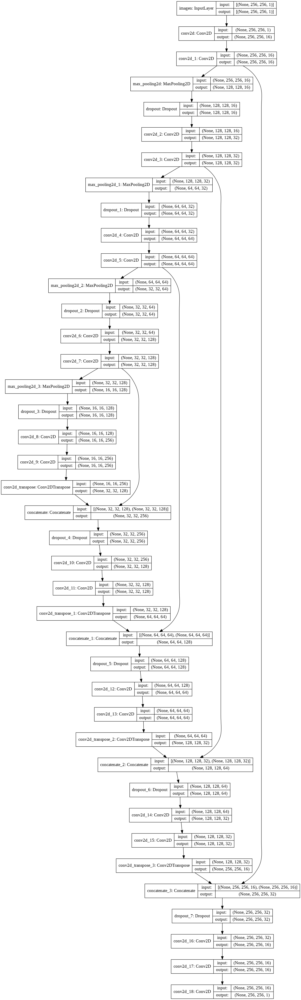

In [ ]:
model.summary()
tf.keras.utils.plot_model(model, show_shapes=True)

# Segmento de Entrenamiento

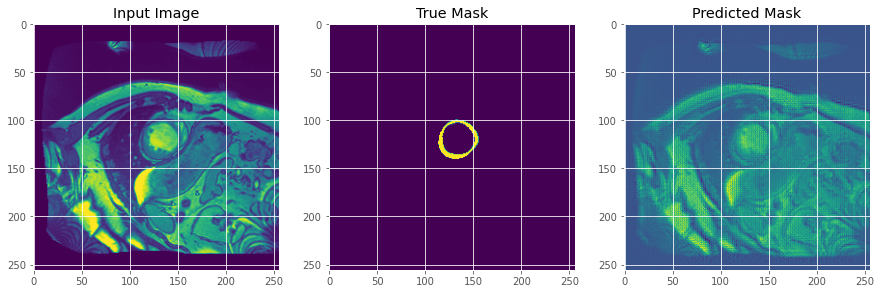

In [ ]:
predict = model.predict(test_imgs[10:11])
for i in range(1):
  display([test_imgs[10], test_annot[10], predict[i]])

Epoch 1/15
143/143 [==============================] - 126s 829ms/step - loss: 0.0589 - accuracy: 0.9819 - mean_io_u: 0.4943 - precision: 0.0109 - recall: 0.0065 - val_loss: 0.0362 - val_accuracy: 0.9877 - val_mean_io_u: 0.4938 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00


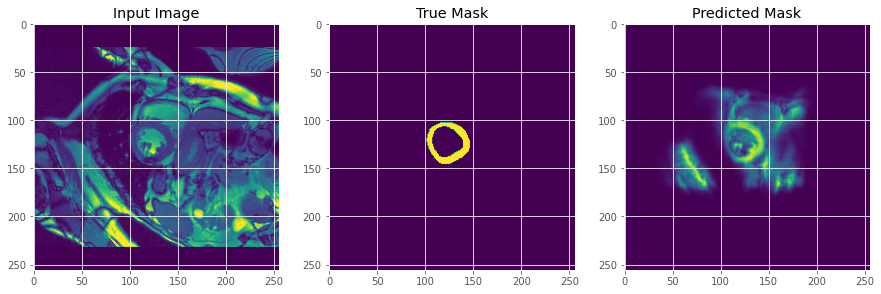


Sample Prediction after epoch 1

Epoch 2/15
143/143 [==============================] - 104s 727ms/step - loss: 0.0232 - accuracy: 0.9886 - mean_io_u: 0.4943 - precision: 0.8336 - recall: 0.0044 - val_loss: 0.0203 - val_accuracy: 0.9881 - val_mean_io_u: 0.4938 - val_precision: 0.8184 - val_recall: 0.0393


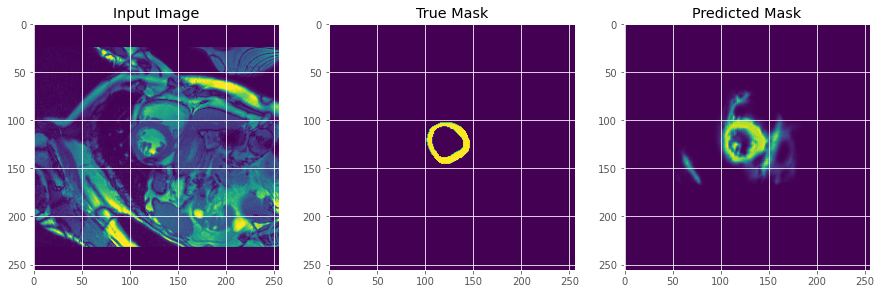


Sample Prediction after epoch 2

Epoch 3/15
143/143 [==============================] - 104s 729ms/step - loss: 0.0155 - accuracy: 0.9923 - mean_io_u: 0.4943 - precision: 0.7738 - recall: 0.4629 - val_loss: 0.0143 - val_accuracy: 0.9942 - val_mean_io_u: 0.4938 - val_precision: 0.7510 - val_recall: 0.7881


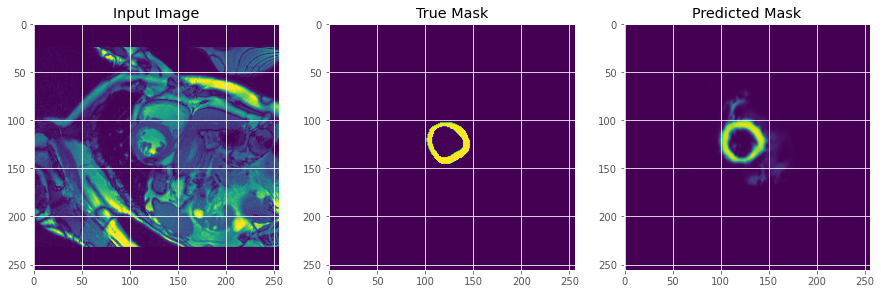


Sample Prediction after epoch 3

Epoch 4/15
143/143 [==============================] - 102s 716ms/step - loss: 0.0102 - accuracy: 0.9957 - mean_io_u: 0.4943 - precision: 0.8145 - recall: 0.8093 - val_loss: 0.0135 - val_accuracy: 0.9952 - val_mean_io_u: 0.4938 - val_precision: 0.8438 - val_recall: 0.7476


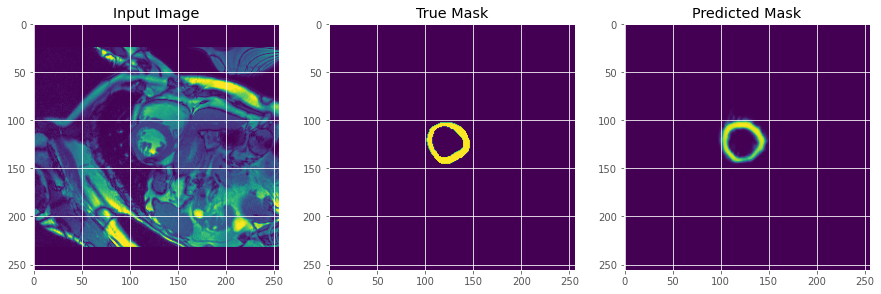


Sample Prediction after epoch 4

Epoch 5/15
143/143 [==============================] - 104s 728ms/step - loss: 0.0084 - accuracy: 0.9964 - mean_io_u: 0.4943 - precision: 0.8472 - recall: 0.8408 - val_loss: 0.0136 - val_accuracy: 0.9955 - val_mean_io_u: 0.4938 - val_precision: 0.8328 - val_recall: 0.7954


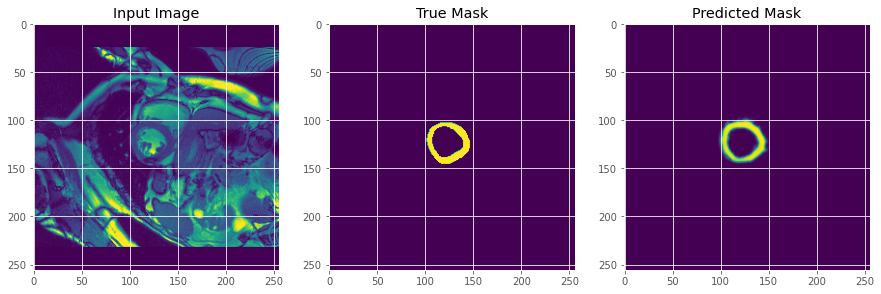


Sample Prediction after epoch 5

Epoch 6/15
143/143 [==============================] - 104s 728ms/step - loss: 0.0074 - accuracy: 0.9969 - mean_io_u: 0.4943 - precision: 0.8650 - recall: 0.8603 - val_loss: 0.0128 - val_accuracy: 0.9959 - val_mean_io_u: 0.4938 - val_precision: 0.8585 - val_recall: 0.7947


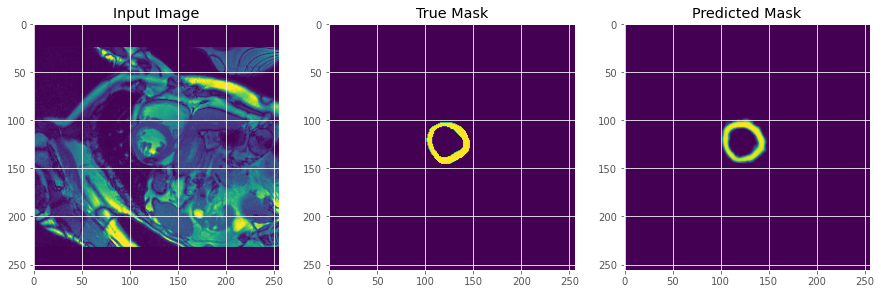


Sample Prediction after epoch 6

Epoch 7/15
143/143 [==============================] - 104s 728ms/step - loss: 0.0068 - accuracy: 0.9971 - mean_io_u: 0.4943 - precision: 0.8767 - recall: 0.8701 - val_loss: 0.0110 - val_accuracy: 0.9959 - val_mean_io_u: 0.4938 - val_precision: 0.8652 - val_recall: 0.7920


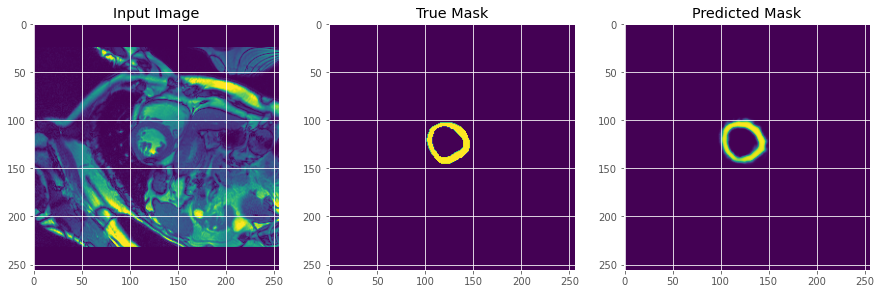


Sample Prediction after epoch 7

Epoch 8/15
143/143 [==============================] - 104s 729ms/step - loss: 0.0067 - accuracy: 0.9972 - mean_io_u: 0.4943 - precision: 0.8794 - recall: 0.8707 - val_loss: 0.0104 - val_accuracy: 0.9960 - val_mean_io_u: 0.4938 - val_precision: 0.8392 - val_recall: 0.8342


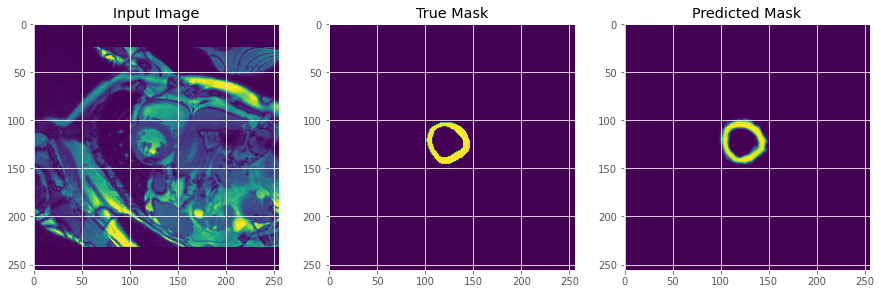


Sample Prediction after epoch 8

Epoch 9/15
143/143 [==============================] - 102s 716ms/step - loss: 0.0062 - accuracy: 0.9973 - mean_io_u: 0.4943 - precision: 0.8857 - recall: 0.8817 - val_loss: 0.0119 - val_accuracy: 0.9960 - val_mean_io_u: 0.4938 - val_precision: 0.8816 - val_recall: 0.7803


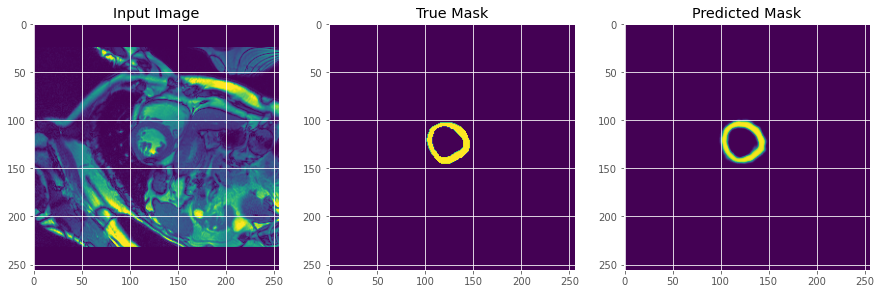


Sample Prediction after epoch 9

Epoch 10/15
143/143 [==============================] - 104s 728ms/step - loss: 0.0058 - accuracy: 0.9975 - mean_io_u: 0.4943 - precision: 0.8936 - recall: 0.8887 - val_loss: 0.0103 - val_accuracy: 0.9963 - val_mean_io_u: 0.4938 - val_precision: 0.8923 - val_recall: 0.7939


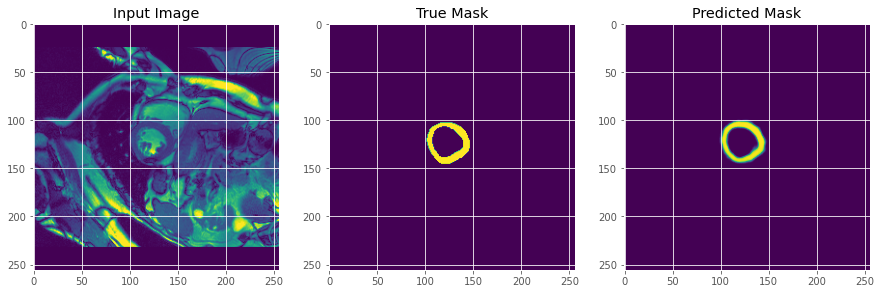


Sample Prediction after epoch 10

Epoch 11/15
143/143 [==============================] - 104s 729ms/step - loss: 0.0056 - accuracy: 0.9976 - mean_io_u: 0.4943 - precision: 0.8976 - recall: 0.8921 - val_loss: 0.0123 - val_accuracy: 0.9962 - val_mean_io_u: 0.4938 - val_precision: 0.8861 - val_recall: 0.7953


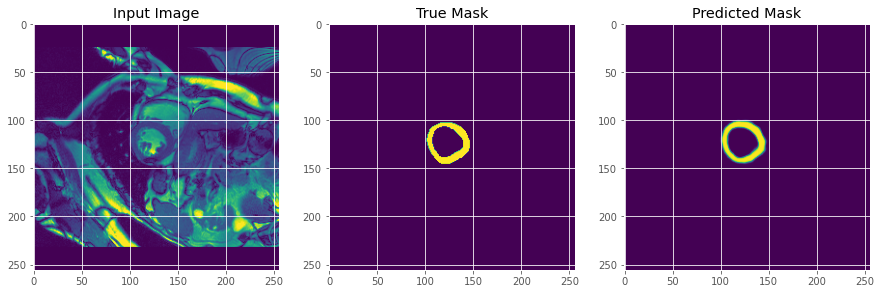


Sample Prediction after epoch 11

Epoch 12/15
143/143 [==============================] - 104s 730ms/step - loss: 0.0055 - accuracy: 0.9977 - mean_io_u: 0.4943 - precision: 0.8992 - recall: 0.8954 - val_loss: 0.0095 - val_accuracy: 0.9965 - val_mean_io_u: 0.4938 - val_precision: 0.8788 - val_recall: 0.8318


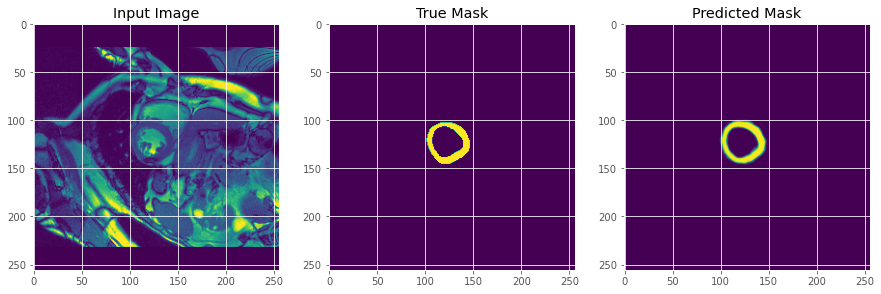


Sample Prediction after epoch 12

Epoch 13/15
143/143 [==============================] - 104s 729ms/step - loss: 0.0053 - accuracy: 0.9977 - mean_io_u: 0.4943 - precision: 0.9017 - recall: 0.8981 - val_loss: 0.0100 - val_accuracy: 0.9965 - val_mean_io_u: 0.4938 - val_precision: 0.9067 - val_recall: 0.7976


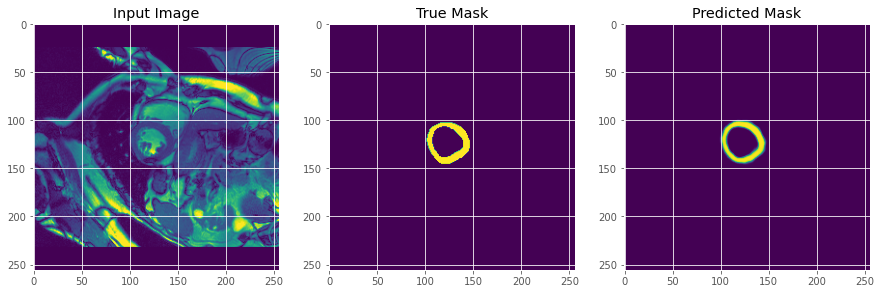


Sample Prediction after epoch 13

Epoch 14/15
143/143 [==============================] - 102s 715ms/step - loss: 0.0052 - accuracy: 0.9978 - mean_io_u: 0.4943 - precision: 0.9035 - recall: 0.9005 - val_loss: 0.0138 - val_accuracy: 0.9960 - val_mean_io_u: 0.4938 - val_precision: 0.9137 - val_recall: 0.7443


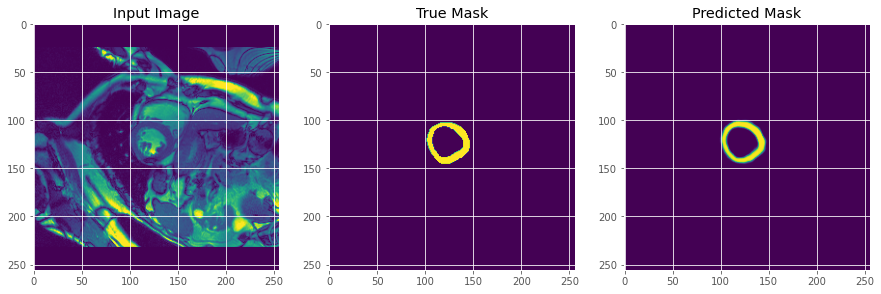


Sample Prediction after epoch 14

Epoch 15/15
143/143 [==============================] - 102s 716ms/step - loss: 0.0052 - accuracy: 0.9978 - mean_io_u: 0.4943 - precision: 0.9049 - recall: 0.9007 - val_loss: 0.0105 - val_accuracy: 0.9964 - val_mean_io_u: 0.4938 - val_precision: 0.9005 - val_recall: 0.7954


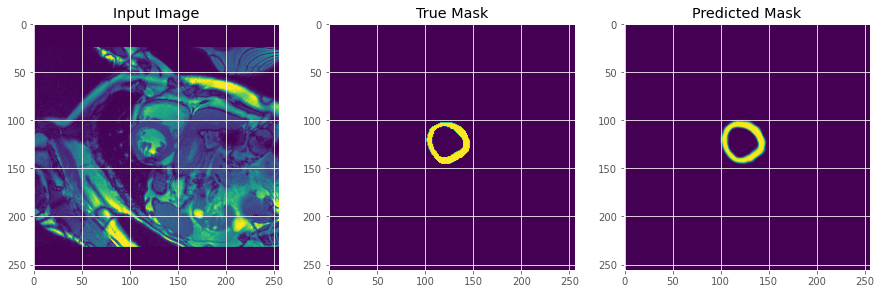


Sample Prediction after epoch 15



In [ ]:
results = model.fit(train_imgs, train_annot, batch_size=32, epochs=15,\
                    validation_data=(test_imgs, test_annot), callbacks = callbacks)

# Segmento de validación y predicción

In [ ]:
predict = model.predict(test_imgs)

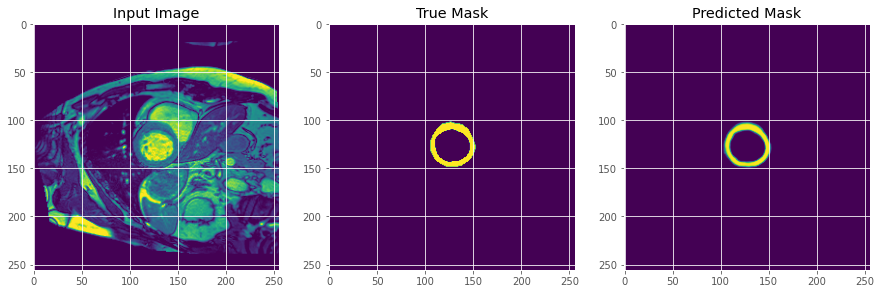

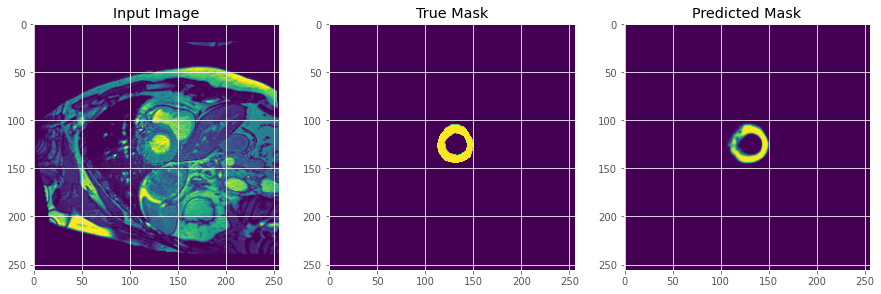

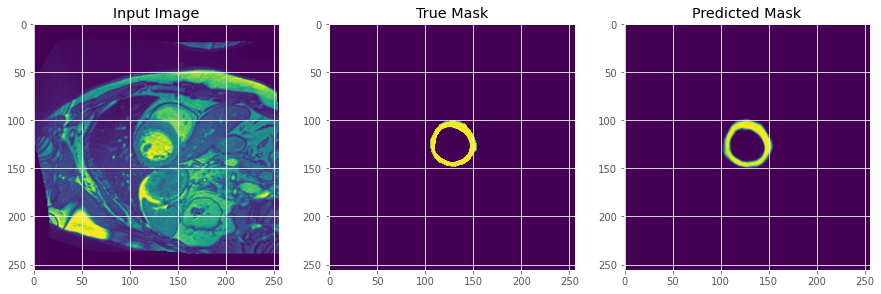

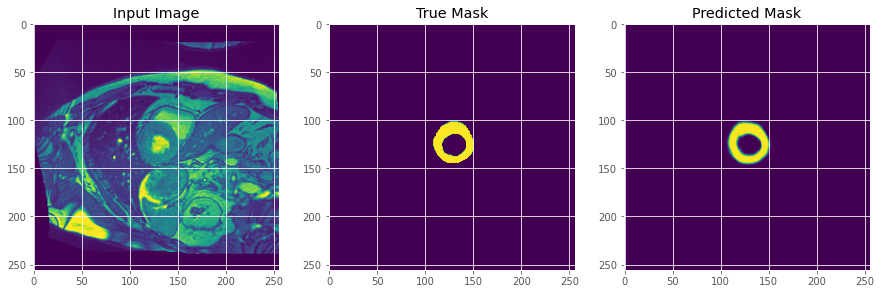

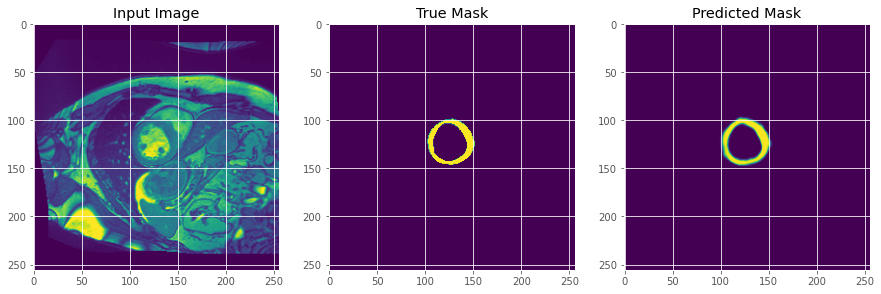

...

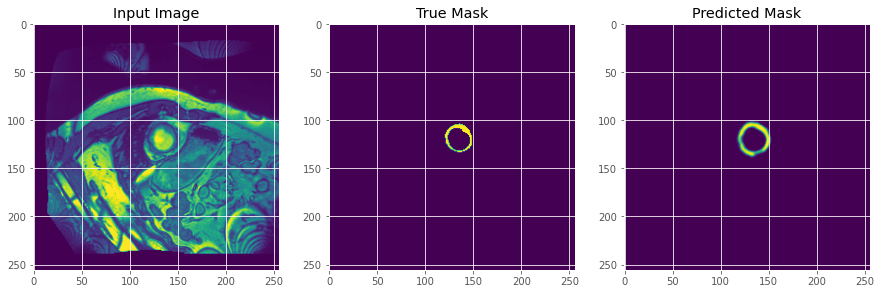

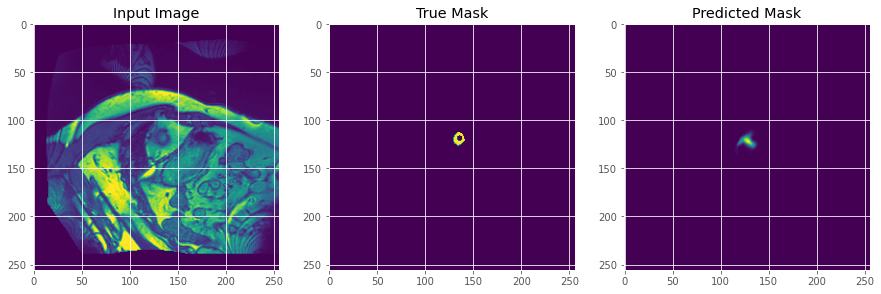

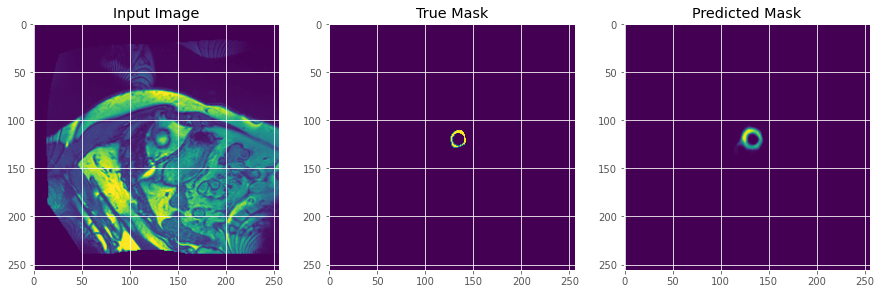

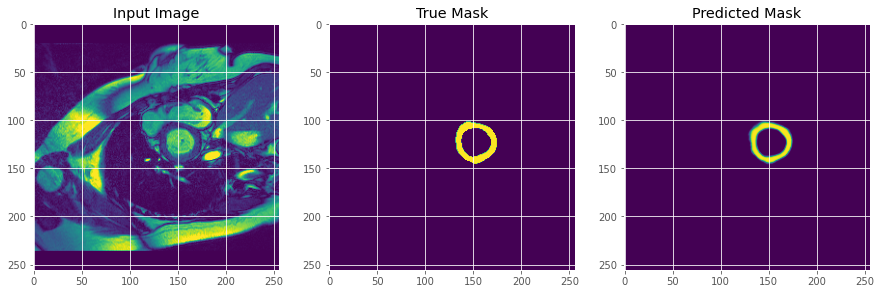

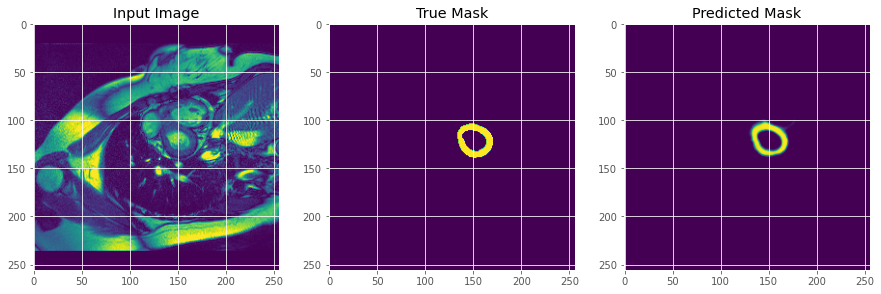

In [ ]:
for i in range(20):
  num = np.random.randint(len(test_imgs)-20)
  display([test_imgs[i], test_annot[i], predict[i]])

# Gráficos de metricas

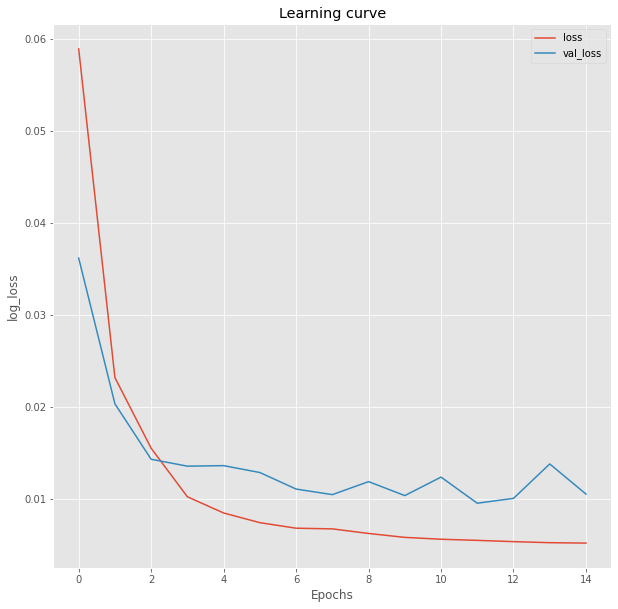

In [ ]:
plt.figure(figsize=(10, 10))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

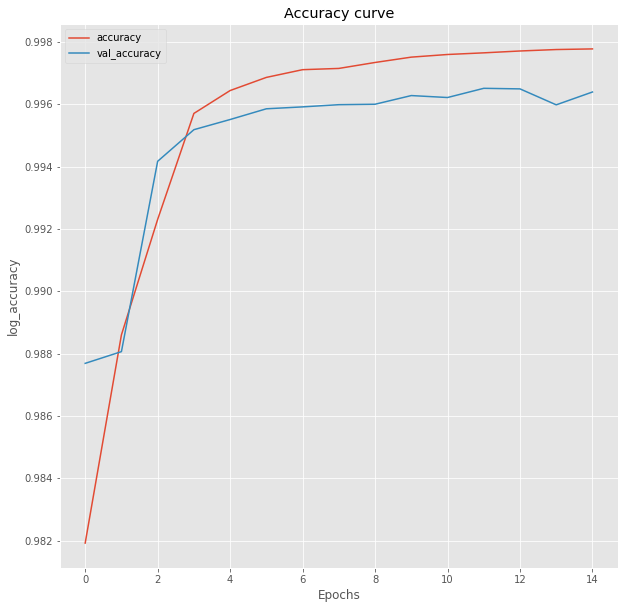

In [ ]:
plt.figure(figsize=(10, 10))
plt.title("Accuracy curve")
plt.plot(results.history["accuracy"], label="accuracy")
plt.plot(results.history["val_accuracy"], label="val_accuracy")
plt.xlabel("Epochs")
plt.ylabel("log_accuracy")
plt.legend();

In [ ]:
# F1-score (DICE)
presicion = results.history["precision"]
presicion_val = results.history["val_precision"]
recall = results.history["recall"]
recall_val = results.history["val_recall"]

dice = (np.multiply(presicion, recall)*2)/(np.add(presicion, recall))
dice_val = (np.multiply(presicion_val, recall_val)*2)/(np.add(presicion_val, recall_val))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  


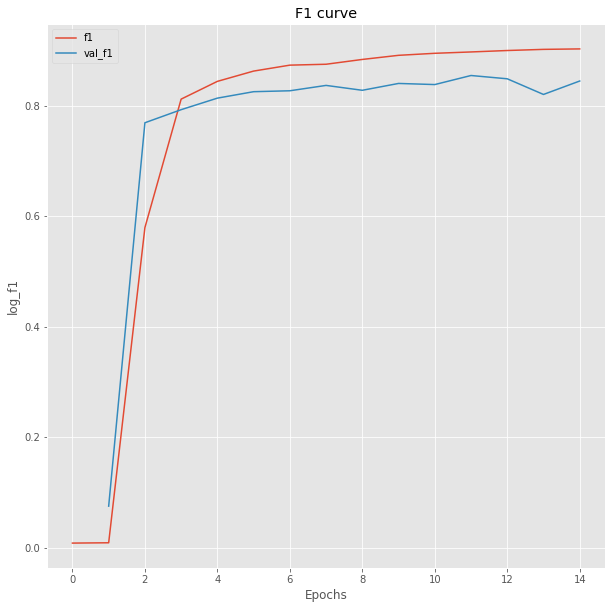

In [ ]:
plt.figure(figsize=(10, 10))
plt.title("F1 curve")
plt.plot(dice, label="f1")
plt.plot(dice_val , label="val_f1")
plt.xlabel("Epochs")
plt.ylabel("log_f1")
plt.legend();

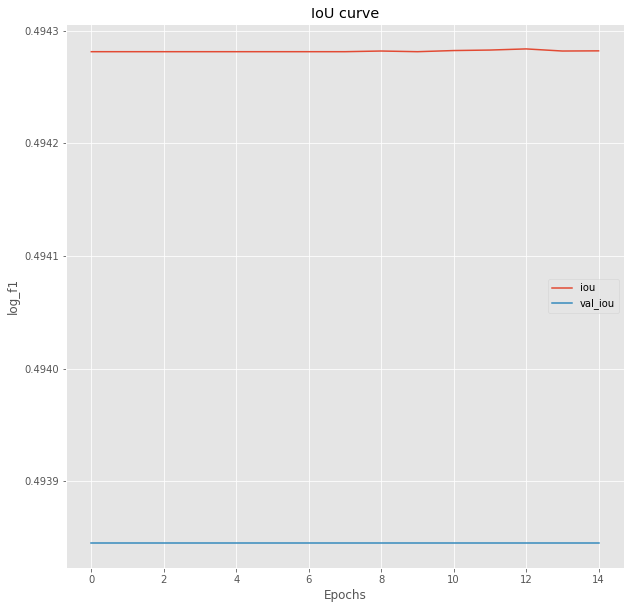

In [ ]:
plt.figure(figsize=(10, 10))
plt.title("IoU curve")
plt.plot(results.history["mean_io_u"], label="iou")
plt.plot(results.history["val_mean_io_u"] , label="val_iou")
plt.xlabel("Epochs")
plt.ylabel("log_f1")
plt.legend();

# Tensorboard

In [ ]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard
%tensorboard --logdir logs/fit2/

Reusing TensorBoard on port 6006 (pid 129), started 0:37:29 ago. (Use '!kill 129' to kill it.)

<IPython.core.display.Javascript object>